# 10장: 적대 샘플

<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/rickiepark/gans-in-action/blob/master/chapter-10/Chapter10_Adversarial_Examples.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />구글 코랩에서 실행하기</a>
  </td>
</table>

_이 노트북은 foolbox 2.4.0 버전과 텐서플로 2.2.0, 멀티백엔드 케라스 2.3.1 버전을 사용합니다._

_코랩에서 실행할 경우 다음 셀의 주석을 제거하고 실행하세요._

In [1]:
#!pip install tensorflow==2.2.0
#!pip install keras==2.3.1
#!pip install foolbox==2.4.0

#!wget https://github.com/rickiepark/gans-in-action/raw/Chapter-10/chapter-10/DSC_0897.jpg
#!wget https://github.com/rickiepark/gans-in-action/raw/Chapter-10/chapter-10/DSC_0896.jpg

#!wget https://github.com/rickiepark/gans-in-action/raw/Chapter-10/chapter-10/initialization_vals_for_noise.csv

In [2]:
import numpy as np
from keras.applications.resnet50 import ResNet50
from foolbox.criteria import Misclassification, ConfidentMisclassification
from keras.preprocessing import image as img
from keras.applications.resnet50 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt
import foolbox
import pprint as pp
import keras
import pandas as pd
%matplotlib inline

Using TensorFlow backend.


## 헬퍼 함수

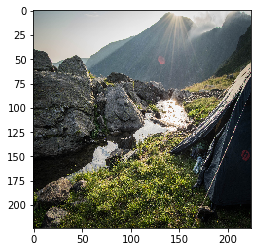

In [3]:
def load_image(img_path: str):
    image = img.load_img(img_path, target_size=(224, 224))
    plt.imshow(image)
    x = img.img_to_array(image)
    return x

image = load_image('DSC_0897.jpg')

## 이미지 공격

In [4]:
# 모델 객체 생성
keras.backend.set_learning_phase(0)
kmodel = ResNet50(weights='imagenet')
preprocessing = (np.array([104, 116, 123]), 1)
# 케라스 모델로 foolbox 모델 객체를 만듭니다.
fmodel = foolbox.models.KerasModel(kmodel, bounds=(0, 255), preprocessing=preprocessing)

# 예측할 이미지가 배치로 들어온다고 가정하기 때문에 ResNet-50에 맞게 
# (1, 224, 224, 3) 크기 이미지로 만듭니다.
to_classify = np.expand_dims(image, axis=0)
# 예측 메서드를 호출하고 결과를 출력합니다.
preds = kmodel.predict(to_classify)
print('원본 샘플 예측:')
pp.pprint(decode_predictions(preds, top=20)[0])
# 나중에 레이블로 사용하기 위해 가장 큰 값의 인덱스를 구합니다.
label = np.array([np.argmax(preds)])

# 케라스 ResNet-50은 RGB가 아니라 BGR을 기대하기 때문에 ::-1로 컬러 채널을 뒤집습니다.
image = image[:, :, ::-1]
# 분류 오류 조건을 높게 지정하한 attack 객체를 만듭니다.
attack = foolbox.attacks.FGSM(fmodel, threshold=.9, criterion=ConfidentMisclassification(.9))
# 원본 이미지에 attack 객체를 적용합니다.
adversarial = attack(np.expand_dims(image, axis=0), label)

# 적대 이미지에 대한 새 예측을 만듭니다.
new_preds = kmodel.predict(adversarial)
print('적대 샘플 예측:')
pp.pprint(decode_predictions(new_preds, top=20)[0])

원본 샘플 예측:
[('n03792972', 'mountain_tent', 0.6872757),
 ('n09399592', 'promontory', 0.07355872),
 ('n09468604', 'valley', 0.07171808),
 ('n04606251', 'wreck', 0.025214337),
 ('n09428293', 'seashore', 0.018810613),
 ('n01498041', 'stingray', 0.010203761),
 ('n04366367', 'suspension_bridge', 0.009102935),
 ('n02077923', 'sea_lion', 0.008893888),
 ('n09472597', 'volcano', 0.007715808),
 ('n09421951', 'sandbar', 0.0056634205),
 ('n09193705', 'alp', 0.0052817836),
 ('n09256479', 'coral_reef', 0.0050706742),
 ('n03042490', 'cliff_dwelling', 0.0048538772),
 ('n03788365', 'mosquito_net', 0.004094159),
 ('n03450230', 'gown', 0.00398121),
 ('n09246464', 'cliff', 0.0034006087),
 ('n04507155', 'umbrella', 0.0025981886),
 ('n09332890', 'lakeside', 0.0024168787),
 ('n02951358', 'canoe', 0.0020540638),
 ('n03160309', 'dam', 0.0020333943)]
적대 샘플 예측:
[('n09472597', 'volcano', 0.59133834),
 ('n04366367', 'suspension_bridge', 0.16853045),
 ('n09468604', 'valley', 0.08688037),
 ('n03792972', 'mountain_tent

## 비교

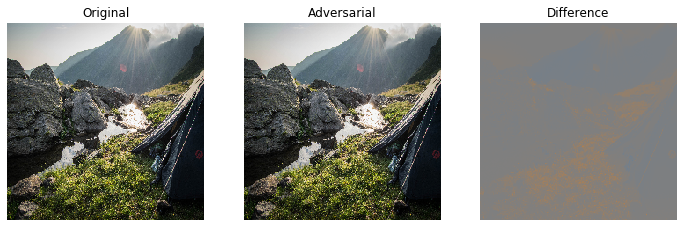

In [5]:
plt.figure(figsize=(12,12))

plt.subplot(1, 3, 1)
plt.title('Original')
plt.imshow(image[:,:,::-1] / 255)  # 225로 나누어 [0, 255]에서 [0, 1]로 변환합니다.
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Adversarial')
plt.imshow(adversarial[0, :, :, ::-1] / 255)  # ::-1로 BGR에서 RGB로 변환합니다.
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Difference')
difference = adversarial[0, :, :, ::-1] - image
plt.imshow(difference / abs(difference).max() * 0.2 + 0.5)
plt.axis('off')

plt.show()

## 가우시안 잡음의 평균과 분산을 로드합니다.

자세한 내용은 이 장의 `get_vals_for_noise.py` 스크립트를 참고하세요.

In [6]:
max_vals = pd.read_csv('initialization_vals_for_noise.csv')

## `ResNet50`에서 평가하기

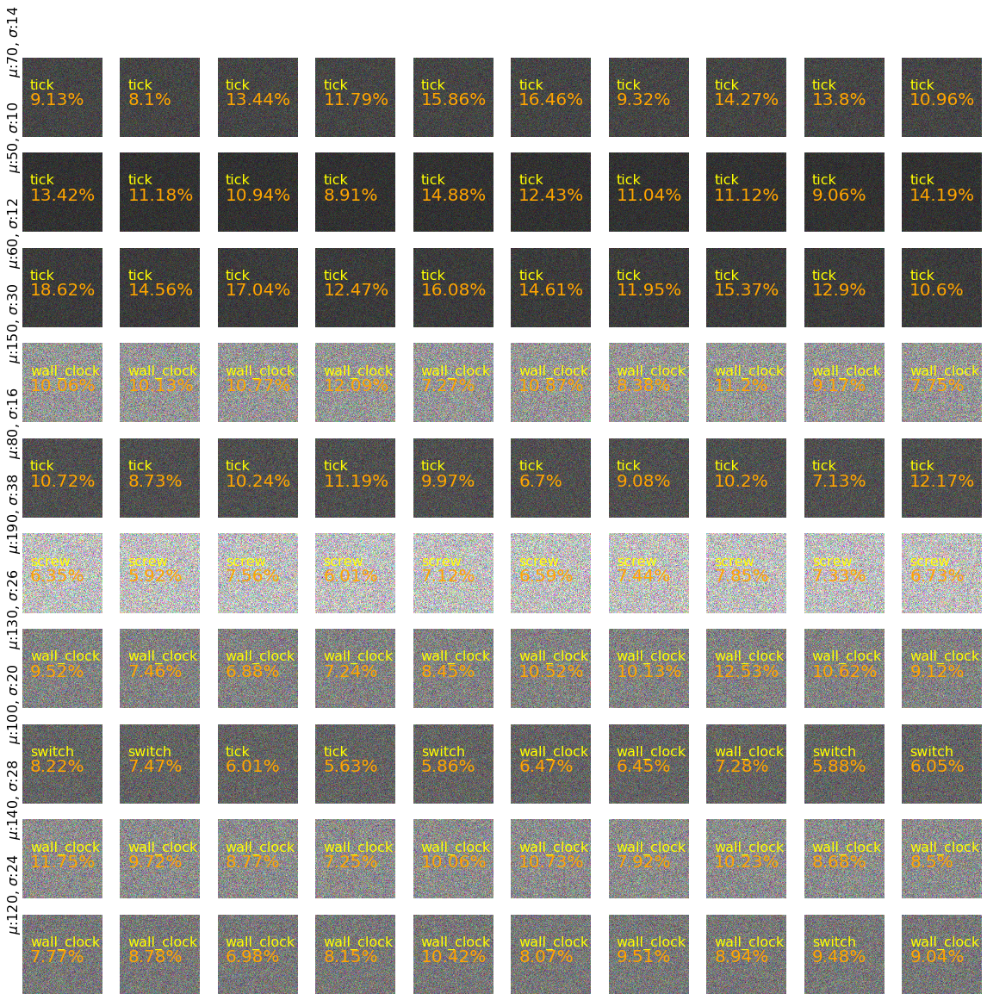

In [7]:
fig = plt.figure(figsize=(20,20))
# 평균과 분산 실수 값 리스트

sigma_list = list(max_vals.sigma)
mu_list = list(max_vals.mu)
conf_list = []

# 그림을 생성하는 핵심 함수
def make_subplot(x, y, z, new_row=False):
    # 주어진 평균과 분산에서 잡음 샘플링
    rand_noise = np.random.normal(loc=mu, scale=sigma, size=(224,224, 3))
    # 0–255 사이 픽셀 값만 헝요됩니다.
    rand_noise = np.clip(rand_noise, 0, 255.)
    # 첫 번째 예측을 만듭니다.
    noise_preds = kmodel.predict(np.expand_dims(rand_noise, axis=0))
    # 예측 클래스와 신뢰도를 얻습니다.
    prediction, num = decode_predictions(noise_preds, top=20)[0][0][1:3]
    num = round(num * 100, 2)
    conf_list.append(num)
    # 주석을 추가합니다.
    ax = fig.add_subplot(x,y,z)
    ax.annotate(prediction, xy=(0.1, 0.6), xycoords=ax.transAxes, fontsize=16, color='yellow')
    ax.annotate(f'{num}%' , xy=(0.1, 0.4), xycoords=ax.transAxes, fontsize=20, color='orange')
    if new_row:
        ax.annotate(f'$\mu$:{mu}, $\sigma$:{sigma}' , xy=(-.2, 0.8), xycoords=ax.transAxes,
                    rotation=90, fontsize=16, color='black')
    # [0, 255]를 255로 나누어 [0, 1]로 바꿉니다.
    ax.imshow(rand_noise / 255) 
    ax.axis('off')


# 서브 그림을 만드는 반복문
for i in range(1,101):
    if (i-1) % 10==0:
        mu = mu_list.pop(0)
        sigma = sigma_list.pop(0)
        make_subplot(10,10, i, new_row=True)
    else:
        make_subplot(10,10, i)

plt.show()

# 적대 공격을 적용하기

예측 신경망을 `ResNet50`로 유지한채 위에서 분류했던 가우시안 잡음을 공격합니다.

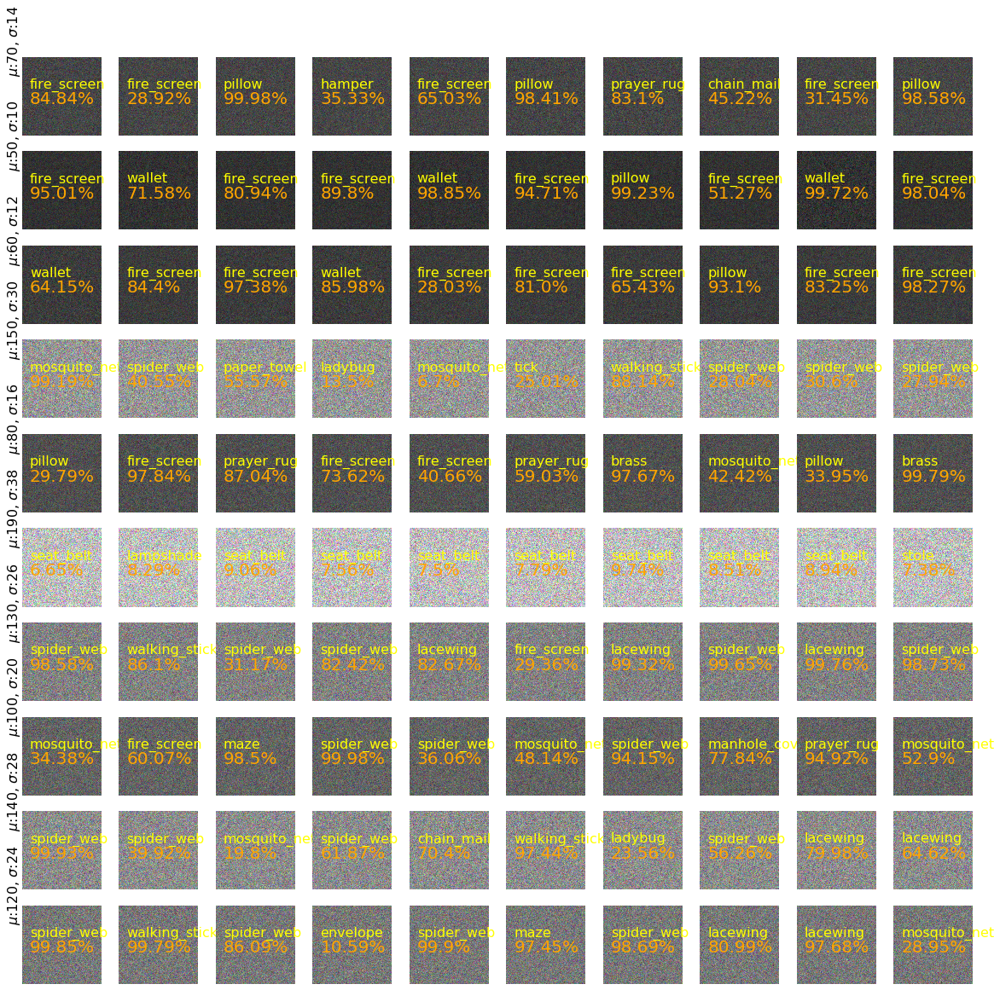

In [8]:
fig = plt.figure(figsize=(20,20))
sigma_list = list(max_vals.sigma)
mu_list = list(max_vals.mu)
sum_pred = []

def make_subplot(x, y, z, new_row=False):
    rand_noise = np.random.normal(loc=mu, scale=sigma, size=(224,224, 3))
    rand_noise = np.clip(rand_noise, 0, 255.)
    first_pred = kmodel.predict(np.expand_dims(rand_noise, axis=0))
    label = np.array([np.argmax(first_pred)])
    attack = foolbox.attacks.ProjectedGradientDescentAttack(fmodel, threshold=.999,
                                         distance=foolbox.distances.Linfinity,
                                         criterion=ConfidentMisclassification(.999))
    adversarial = attack(np.expand_dims(rand_noise[:, :, ::-1], axis=0), label)
    noise_preds = kmodel.predict(adversarial)
    prediction, num = decode_predictions(noise_preds, top=20)[0][0][1:3]
    num = round(num * 100, 2)
    sum_pred.append(num)
    ax = fig.add_subplot(x,y,z)
    ax.annotate(prediction, xy=(0.1, 0.6), xycoords=ax.transAxes, fontsize=16, color='yellow')
    ax.annotate(f'{num}%', xy=(0.1, 0.4), xycoords=ax.transAxes, fontsize=20, color='orange')
    if new_row:
        ax.annotate(f'$\mu$:{mu}, $\sigma$:{sigma}' , xy=(-.2, 0.8), xycoords=ax.transAxes,
                    rotation=90, fontsize=16, color='black')
    ax.imshow(adversarial[0] / 255)  # [0, 255]를 255로 나누어 [0, 1]로 바꿉니다.
    ax.axis('off')

    
for i in range(1,101):
    if (i-1) % 10==0:
        mu = mu_list.pop(0)
        sigma = sigma_list.pop(0)
        make_subplot(10,10, i, new_row=True) 
    else:
        make_subplot(10,10, i)

plt.show()

# `InceptionV3`로 동일한 작업을 시도합니다.

또 다른 표준 분류기인 인셉션 신경망은 바로 실패합니다.

랜덤한 평균과 표준편차를 사용하더라도 `InceptionV3`는 적절한 전처리 과정이 없기 때문에 어려움을 겼습니다. 하지만 공격자 입장에서는 머신러닝이 필요하지 않아 `InceptionV3`에 쉽게 제기할 수 있는 종류의 공격입니다.

In [9]:
from keras.applications.inception_v3 import InceptionV3, decode_predictions

# 모델 객체를 만듭니다.
keras.backend.set_learning_phase(0)
kmodel_v3 = InceptionV3(weights='imagenet')

96116736/96112376 [==============================] - 14s 0us/step


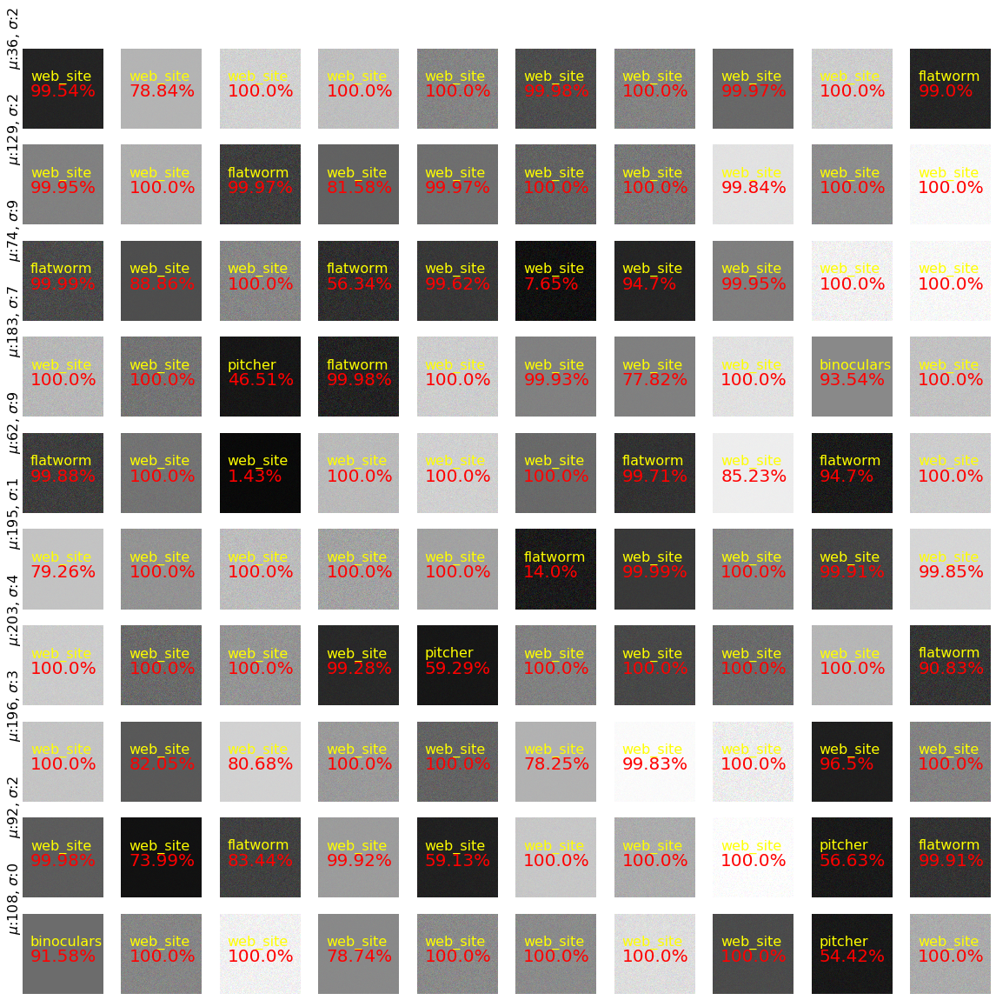

In [10]:
fig = plt.figure(figsize=(20,20))
conf_list = []

def make_subplot(x, y, z, new_row=False):
    mu = np.random.randint(0, 255)
    sigma = np.random.randint(0, 10)
    rand_noise = np.random.normal(loc=mu, 
                                  scale=sigma, size=(299,299, 3))
    rand_noise = np.clip(rand_noise, 0, 255.)
    noise_preds = kmodel_v3.predict(np.expand_dims(rand_noise, axis=0))
    prediction, num = decode_predictions(noise_preds, top=20)[0][0][1:3]
    num = round(num * 100, 2)
    conf_list.append(num)
    ax = fig.add_subplot(x,y,z)
    ax.annotate(prediction, xy=(0.1, 0.6), xycoords=ax.transAxes, fontsize=16, color='yellow')
    ax.annotate(f'{num}%' , xy=(0.1, 0.4), xycoords=ax.transAxes, fontsize=20, color='red')
    if new_row:
        ax.annotate(f'$\mu$:{mu}, $\sigma$:{sigma}' , xy=(-.2, 0.8), xycoords=ax.transAxes,
                    rotation=90, fontsize=16, color='black')
    ax.imshow(rand_noise / 255)  # [0, 255]를 255로 나누어 [0, 1]로 바꿉니다.
    ax.axis('off')

    
for i in range(1,101):
    if (i-1) % 10==0:
        make_subplot(10,10, i, new_row=True)
    else:
        make_subplot(10,10, i)

plt.show()